In [3]:
import pandas as pd
from sqlalchemy import create_engine

# Database connection parameters
db_user = 'root'
db_password = 'root'  
db_host = 'localhost'
db_port = '5432'
db_name = 'ny_taxi'


engine = create_engine(f'postgresql+psycopg2://{db_user}:{db_password}@{db_host}:{db_port}/{db_name}')


query = """
SELECT 
    t.*,
    p.payment_description,
    r.rate_description,
    s.description AS store_and_fwd_description,
    pul."Zone" AS pickup_zone,
    pul."Borough" AS pickup_borough,
    dol."Zone" AS dropoff_zone,
    dol."Borough" AS dropoff_borough
FROM taxi t
LEFT JOIN payment_types p ON t.payment_type = p.payment_id
LEFT JOIN rate_code r ON t."RatecodeID" = r.rate_code_id
LEFT JOIN store_and_fwd_flag s ON t.store_and_fwd_flag = s.flag
LEFT JOIN taxi_zone_lookup pul ON t."PULocationID" = pul."LocationID"
LEFT JOIN taxi_zone_lookup dol ON t."DOLocationID" = dol."LocationID";
"""


df = pd.read_sql(query, con=engine)


print(df.head())



  index  VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
0  None       2.0  2021-01-01 02:50:39   2021-01-01 02:59:26              6.0   
1  None       2.0  2021-01-01 01:27:10   2021-01-01 01:29:19              1.0   
2  None       2.0  2021-01-01 01:44:16   2021-01-01 02:00:12              1.0   
3  None       2.0  2021-01-01 01:42:18   2021-01-01 01:45:04              6.0   
4  None       1.0  2021-01-01 01:19:34   2021-01-01 01:31:33              2.0   

   trip_distance  RatecodeID store_and_fwd_flag  PULocationID  DOLocationID  \
0           2.17         1.0                  N            48           141   
1           0.86         1.0                  N           140           262   
2           3.77         1.0                  N           141           234   
3           1.33         1.0                  N           137           229   
4           2.80         1.0                  N           186           141   

   ...  improvement_surcharge  total_a

In [4]:
df.describe()

,VendorID,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
count,1.271413e+06,1.271413e+06,1.369765e+06,1.271413e+06,1.369765e+06,1.369765e+06,1.271413e+06,1.369765e+06,1.369765e+06,1.369765e+06,1.369765e+06,1.369765e+06,1.369765e+06,1.369765e+06,1.369765e+06
mean,1.676925e+00,1.411508e+00,4.631982e+00,1.035081e+00,1.652472e+02,1.614956e+02,1.280521e+00,1.209662e+01,9.705085e-01,4.930411e-01,1.918099e+00,2.477432e-01,2.969412e-01,1.747439e+01,2.116098e+00
std,4.676513e-01,1.059833e+00,3.939042e+02,5.994840e-01,6.783849e+01,7.210800e+01,4.916921e-01,1.291338e+01,1.231256e+00,7.632070e-02,2.597153e+00,1.672755e+00,4.222174e-02,1.469343e+01,9.287277e-01
min,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,-4.900000e+02,-5.500000e+00,-5.000000e-01,-1.000000e+02,-3.112000e+01,-3.000000e-01,-4.928000e+02,-2.500000e+00
25%,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.240000e+02,1.070000e+02,1.000000e+00,6.000000e+00,0.000000e+00,5.000000e-01,0.000000e+00,0.000000e+00,3.000000e-01,1.080000e+01,2.500000e+00
50%,2.000000e+00,1.000000e+00,1.700000e+00,1.000000e+00,1.620000e+02,1.620000e+02,1.000000e+00,8.500000e+00,0.000000e+00,5.000000e-01,1.860000e+00,0.000000e+00,3.000000e-01,1.380000e+01,2.500000e+00
75%,2.000000e+00,1.000000e+00,3.020000e+00,1.000000e+00,2.360000e+02,2.360000e+02,2.000000e+00,1.350000e+01,2.500000e+00,5.000000e-01,2.750000e+00,0.000000e+00,3.000000e-01,1.912000e+01,2.500000e+00
max,2.000000e+00,8.000000e+00,2.631633e+05,9.900000e+01,2.650000e+02,2.650000e+02,4.000000e+00,6.960500e+03,8.250000e+00,5.000000e-01,1.140440e+03,8.117500e+02,3.000000e-01,7.661280e+03,3.000000e+00


In [6]:
df.columns

Index(['index', 'VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag',
       'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra',
       'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'total_amount', 'congestion_surcharge', 'payment_description',
       'rate_description', 'store_and_fwd_description', 'pickup_zone',
       'pickup_borough', 'dropoff_zone', 'dropoff_borough'],
      dtype='object')

In [8]:
df[df.isnull()].count()

index                        0
VendorID                     0
tpep_pickup_datetime         0
tpep_dropoff_datetime        0
passenger_count              0
trip_distance                0
RatecodeID                   0
store_and_fwd_flag           0
PULocationID                 0
DOLocationID                 0
payment_type                 0
fare_amount                  0
extra                        0
mta_tax                      0
tip_amount                   0
tolls_amount                 0
improvement_surcharge        0
total_amount                 0
congestion_surcharge         0
payment_description          0
rate_description             0
store_and_fwd_description    0
pickup_zone                  0
pickup_borough               0
dropoff_zone                 0
dropoff_borough              0
dtype: int64

In [9]:
df.isnull().sum()


index                        1369765
VendorID                       98352
tpep_pickup_datetime               0
tpep_dropoff_datetime              0
passenger_count                98352
trip_distance                      0
RatecodeID                     98352
store_and_fwd_flag             98352
PULocationID                       0
DOLocationID                       0
payment_type                   98352
fare_amount                        0
extra                              0
mta_tax                            0
tip_amount                         0
tolls_amount                       0
improvement_surcharge              0
total_amount                       0
congestion_surcharge               0
payment_description            98352
rate_description               98388
store_and_fwd_description      98352
pickup_zone                     9499
pickup_borough                 10963
dropoff_zone                    9372
dropoff_borough                 3334
dtype: int64

In [10]:
# Display rows where any column has missing values
missing_rows = df[df.isnull().any(axis=1)]
print(missing_rows)


        index  VendorID tpep_pickup_datetime tpep_dropoff_datetime  \
0        None       2.0  2021-01-01 02:50:39   2021-01-01 02:59:26   
1        None       2.0  2021-01-01 01:27:10   2021-01-01 01:29:19   
2        None       2.0  2021-01-01 01:44:16   2021-01-01 02:00:12   
3        None       2.0  2021-01-01 01:42:18   2021-01-01 01:45:04   
4        None       1.0  2021-01-01 01:19:34   2021-01-01 01:31:33   
...       ...       ...                  ...                   ...   
1369760  None       NaN  2021-01-29 18:19:00   2021-01-29 18:29:00   
1369761  None       NaN  2021-01-29 18:23:43   2021-01-29 18:48:07   
1369762  None       NaN  2021-01-29 18:01:57   2021-01-29 18:01:19   
1369763  None       NaN  2021-01-29 18:02:00   2021-01-29 18:08:00   
1369764  None       NaN  2021-01-29 18:26:00   2021-01-29 18:30:00   

         passenger_count  trip_distance  RatecodeID store_and_fwd_flag  \
0                    6.0           2.17         1.0                  N   
1          

In [11]:
df[df['VendorID'].isnull()]

,index,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,...,improvement_surcharge,total_amount,congestion_surcharge,payment_description,rate_description,store_and_fwd_description,pickup_zone,pickup_borough,dropoff_zone,dropoff_borough
1271413,None,NaN,2021-01-06 06:44:00,2021-01-06 07:00:00,NaN,6.76,NaN,None,261,162,...,0.3,27.71,2.5,None,None,None,World Trade Center,Manhattan,Midtown East,Manhattan
1271414,None,NaN,2021-01-06 06:23:16,2021-01-06 06:51:45,NaN,10.99,NaN,None,61,14,...,0.3,34.14,0.0,None,None,None,Crown Heights North,Brooklyn,Bay Ridge,Brooklyn
1271415,None,NaN,2021-01-06 06:03:00,2021-01-06 06:22:00,NaN,4.19,NaN,None,69,24,...,0.3,28.51,0.0,None,None,None,East Concourse/Concourse Village,Bronx,Bloomingdale,Manhattan
1271416,None,NaN,2021-01-06 06:57:38,2021-01-06 07:31:59,NaN,15.24,NaN,None,81,233,...,0.3,50.21,0.0,None,None,None,Eastchester,Bronx,UN/Turtle Bay South,Manhattan
1271417,None,NaN,2021-01-06 06:04:00,2021-01-06 06:16:00,NaN,3.11,NaN,None,238,116,...,0.3,16.86,2.5,None,None,None,Upper West Side North,Manhattan,Hamilton Heights,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1369760,None,NaN,2021-01-29 18:19:00,2021-01-29 18:29:00,NaN,2.90,NaN,None,142,166,...,0.3,22.70,2.5,None,None,None,Lincoln Square East,Manhattan,Morningside Heights,Manhattan
1369761,None,NaN,2021-01-29 18:23:43,2021-01-29 18:48:07,NaN,10.76,NaN,None,137,133,...,0.3,38.02,0.0,None,None,None,Kips Bay,Manhattan,Kensington,Brooklyn
1369762,None,NaN,2021-01-29 18:01:57,2021-01-29 18:01:19,NaN,13.26,NaN,None,265,236,...,0.3,37.54,0.0,None,None,None,Outside of NYC,None,Upper East Side North,Manhattan
1369763,None,NaN,2021-01-29 18:02:00,2021-01-29 18:08:00,NaN,0.75,NaN,None,21,108,...,0.3,15.87,0.0,None,None,None,Bensonhurst East,Brooklyn,Gravesend,Brooklyn


In [13]:
df['VendorID'].value_counts()


2.0    860651
1.0    410762
Name: VendorID, dtype: int64

In [49]:

pd.set_option('display.max_rows', None)
pd.set_option('display.min_rows', None)

In [26]:
df[['VendorID', 'total_amount','pickup_zone','pickup_borough']]

,VendorID,total_amount,pickup_zone,pickup_borough
0,2.0,12.80,Clinton East,Manhattan
1,2.0,9.96,Lenox Hill East,Manhattan
2,2.0,20.30,Lenox Hill West,Manhattan
3,2.0,11.16,Kips Bay,Manhattan
4,1.0,18.36,Penn Station/Madison Sq West,Manhattan
5,1.0,27.00,Manhattanville,Manhattan
6,2.0,32.24,TriBeCa/Civic Center,Manhattan
7,1.0,18.55,Lincoln Square East,Manhattan
8,1.0,11.15,Yorkville East,Manhattan
9,1.0,10.75,Yorkville East,Manhattan


In [27]:
# Summary of rows with missing VendorID
print(df[df['VendorID'].isnull()].describe())


       VendorID  passenger_count  trip_distance  RatecodeID  PULocationID  \
count       0.0              0.0   98352.000000         0.0  98352.000000   
mean        NaN              NaN      29.665126         NaN    151.424486   
std         NaN              NaN    1423.814138         NaN     81.798251   
min         NaN              NaN       0.000000         NaN      1.000000   
25%         NaN              NaN       2.100000         NaN     75.000000   
50%         NaN              NaN       4.740000         NaN    151.000000   
75%         NaN              NaN       9.690000         NaN    233.000000   
max         NaN              NaN  263163.280000         NaN    265.000000   

       DOLocationID  payment_type   fare_amount         extra       mta_tax  \
count  98352.000000           0.0  98352.000000  98352.000000  98352.000000   
mean     135.552597           NaN     26.088591      0.811197      0.495465   
std       76.149479           NaN     14.421391      1.313950      0.

In [40]:
df_dropped = df.dropna(subset=['VendorID', 'passenger_count', 'RatecodeID', 'payment_type'])


In [41]:
df_dropped.isnull().sum()

index                        1271413
VendorID                           0
tpep_pickup_datetime               0
tpep_dropoff_datetime              0
passenger_count                    0
trip_distance                      0
RatecodeID                         0
store_and_fwd_flag                 0
PULocationID                       0
DOLocationID                       0
payment_type                       0
fare_amount                        0
extra                              0
mta_tax                            0
tip_amount                         0
tolls_amount                       0
improvement_surcharge              0
total_amount                       0
congestion_surcharge               0
payment_description                0
rate_description                  36
store_and_fwd_description          0
pickup_zone                     9310
pickup_borough                   549
dropoff_zone                    9233
dropoff_borough                 3040
dtype: int64

In [71]:
df_dropped[df_dropped['dropoff_zone'].isnull()]


,index,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,...,improvement_surcharge,total_amount,congestion_surcharge,payment_description,rate_description,store_and_fwd_description,pickup_zone,pickup_borough,dropoff_zone,dropoff_borough
53,None,2.0,2021-01-01 01:32:00,2021-01-01 01:32:02,2.0,0.00,5.0,N,264,264,...,0.3,14.75,0.0,Credit card,Negotiated fare,Not a store and forward trip,None,Manhattan,None,Unknown
109,None,2.0,2021-01-01 01:03:37,2021-01-01 01:12:22,1.0,2.49,1.0,N,230,264,...,0.3,15.96,2.5,Credit card,Standard rate,Not a store and forward trip,Times Sq/Theatre District,Manhattan,None,Unknown
237,None,2.0,2021-01-01 01:00:59,2021-01-01 01:01:03,2.0,0.11,5.0,N,264,264,...,0.3,42.80,0.0,Credit card,Negotiated fare,Not a store and forward trip,None,Manhattan,None,Unknown
501,None,1.0,2021-01-01 01:51:11,2021-01-01 01:54:52,1.0,0.90,1.0,N,264,264,...,0.3,8.80,0.0,Credit card,Standard rate,Not a store and forward trip,None,Manhattan,None,Unknown
566,None,2.0,2021-01-01 01:15:33,2021-01-01 01:15:36,2.0,0.00,5.0,N,7,264,...,0.3,35.30,0.0,Credit card,Negotiated fare,Not a store and forward trip,Astoria,Queens,None,Unknown
588,None,2.0,2021-01-01 01:37:42,2021-01-01 02:01:01,1.0,6.43,1.0,N,264,264,...,0.3,28.56,0.0,Credit card,Standard rate,Not a store and forward trip,None,Manhattan,None,Unknown
590,None,2.0,2021-01-01 01:20:50,2021-01-01 01:37:18,1.0,6.72,1.0,N,74,264,...,0.3,21.80,0.0,Credit card,Standard rate,Not a store and forward trip,East Harlem North,Manhattan,None,Unknown
599,None,1.0,2021-01-01 01:11:56,2021-01-01 01:14:40,1.0,0.70,1.0,N,264,264,...,0.3,6.95,0.0,Credit card,Standard rate,Not a store and forward trip,None,Manhattan,None,Unknown
639,None,2.0,2021-01-01 01:15:53,2021-01-01 01:22:35,1.0,3.34,1.0,N,264,264,...,0.3,15.80,2.5,Credit card,Standard rate,Not a store and forward trip,None,Manhattan,None,Unknown
640,None,2.0,2021-01-01 01:38:26,2021-01-01 01:47:06,2.0,2.97,1.0,N,264,264,...,0.3,15.96,2.5,Credit card,Standard rate,Not a store and forward trip,None,Manhattan,None,Unknown


In [51]:

pickup_stats = df.groupby('pickup_borough')['total_amount'].agg(['mean', 'median', 'min', 'max', 'count']).sort_values(by='mean')
print(pickup_stats)


                     mean  median     min      max    count
pickup_borough                                             
Manhattan       15.361709  13.300 -492.80  7661.28  1230466
Unknown         19.288598  13.560  -61.30   831.00     9499
Brooklyn        30.528958  26.870  -69.88   414.36    28324
Bronx           31.793533  26.480  -81.42   296.31    15220
Queens          41.725807  40.070 -252.30   832.54    74860
EWR             68.079245  80.800    0.31   192.30       53
Staten Island   85.203500  84.355  -31.30   156.55      380


In [52]:
dropoff_stats = df.groupby('dropoff_borough')['total_amount'].agg(['mean', 'median', 'min', 'max', 'count']).sort_values(by='mean')
print(dropoff_stats)


                      mean  median     min      max    count
dropoff_borough                                             
Manhattan        15.273642  13.000 -492.80  7661.28  1200320
Unknown          17.226135  12.360 -252.30   831.00     9372
Queens           30.570048  27.800 -225.30   815.05    57852
Bronx            33.358244  29.800  -81.42   174.92    30195
Brooklyn         33.873319  31.000  -65.80  1155.65    67194
Staten Island    78.323125  76.000  -78.04   187.70      816
EWR              91.858798  90.055  -90.55   207.77      682


In [53]:

df[df['PULocationID'] == 264]['total_amount'].describe()


count    9499.000000
mean       19.288598
std        19.769754
min       -61.300000
25%         9.950000
50%        13.560000
75%        21.360000
max       831.000000
Name: total_amount, dtype: float64

In [54]:

df_dropped.loc[df_dropped['PULocationID'] == 264, 'pickup_borough'] = 'Manhattan'


In [56]:

missing_dropoff_borough = df_dropped[df_dropped['dropoff_borough'].isnull() & df_dropped['pickup_borough'].notnull()]
print(missing_dropoff_borough[['pickup_borough', 'dropoff_borough', 'dropoff_zone']])

        pickup_borough dropoff_borough    dropoff_zone
64              Queens            None  Outside of NYC
1125            Queens            None  Outside of NYC
2713            Queens            None  Outside of NYC
2975            Queens            None  Outside of NYC
2980         Manhattan            None  Outside of NYC
3419         Manhattan            None  Outside of NYC
3517         Manhattan            None  Outside of NYC
3572            Queens            None  Outside of NYC
3959            Queens            None  Outside of NYC
5566         Manhattan            None  Outside of NYC
7717            Queens            None  Outside of NYC
8572         Manhattan            None  Outside of NYC
11444           Queens            None  Outside of NYC
11600           Queens            None  Outside of NYC
11694           Queens            None  Outside of NYC
11723           Queens            None  Outside of NYC
12815           Queens            None  Outside of NYC
14218     

In [59]:
missing_pickup_borough = df_dropped[df_dropped['pickup_borough'].isnull() & df_dropped['dropoff_borough'].notnull()]
print(missing_pickup_borough[['pickup_borough', 'dropoff_borough', 'dropoff_zone','pickup_zone']])

        pickup_borough dropoff_borough                       dropoff_zone  \
13542             None        Brooklyn                         Bath Beach   
19597             None          Queens                       Far Rockaway   
29612             None          Queens                 Murray Hill-Queens   
34270             None           Bronx                         Pelham Bay   
42787             None           Bronx                         Highbridge   
44306             None          Queens                         Douglaston   
45540             None           Bronx             West Farms/Bronx River   
46094             None         Unknown                               None   
52040             None           Bronx             West Farms/Bronx River   
52643             None         Unknown                               None   
62840             None        Brooklyn                Crown Heights North   
64219             None           Bronx              Soundview/Castle Hill   

In [60]:
#after analyses we found out there are some boroughes missing because the pickup and dropoff are out side nyc

In [66]:
missing_pickup_zones = df_dropped[df_dropped['pickup_zone'].isnull()]
print(missing_pickup_zones[['pickup_borough', 'pickup_zone',  'dropoff_zone']].head(100))

      pickup_borough pickup_zone                   dropoff_zone
53         Manhattan        None                           None
115        Manhattan        None  Sutton Place/Turtle Bay North
237        Manhattan        None                           None
501        Manhattan        None                           None
588        Manhattan        None                           None
599        Manhattan        None                           None
639        Manhattan        None                           None
640        Manhattan        None                           None
695        Manhattan        None                           None
696        Manhattan        None                           None
812        Manhattan        None                           None
813        Manhattan        None                           None
908        Manhattan        None      Times Sq/Theatre District
909        Manhattan        None                   Bloomingdale
1052       Manhattan        None        

In [67]:
common_pickup_zones = df_dropped[df_dropped['pickup_zone'].notnull()].groupby('dropoff_zone')['pickup_zone'].agg(lambda x: x.value_counts().index[0])
print(common_pickup_zones)

dropoff_zone
Allerton/Pelham Gardens                                     JFK Airport
Alphabet City                                              East Village
Arden Heights                                          South Ozone Park
Arrochar/Fort Wadsworth                                     JFK Airport
Astoria                                               LaGuardia Airport
Astoria Park                                                JFK Airport
Auburndale                                                  JFK Airport
Baisley Park                                                JFK Airport
Bath Beach                                                  JFK Airport
Battery Park                                       TriBeCa/Civic Center
Battery Park City                                          West Village
Bay Ridge                                                   JFK Airport
Bay Terrace/Fort Totten                                     JFK Airport
Bayside                                            

In [68]:

common_pickup_zones_by_dropoff = df_dropped[df_dropped['pickup_zone'].notnull()].groupby('dropoff_zone')['pickup_zone'].agg(lambda x: x.value_counts().index[0])

print(common_pickup_zones_by_dropoff.head(10))


dropoff_zone
Allerton/Pelham Gardens             JFK Airport
Alphabet City                      East Village
Arden Heights                  South Ozone Park
Arrochar/Fort Wadsworth             JFK Airport
Astoria                       LaGuardia Airport
Astoria Park                        JFK Airport
Auburndale                          JFK Airport
Baisley Park                        JFK Airport
Bath Beach                          JFK Airport
Battery Park               TriBeCa/Civic Center
Name: pickup_zone, dtype: object


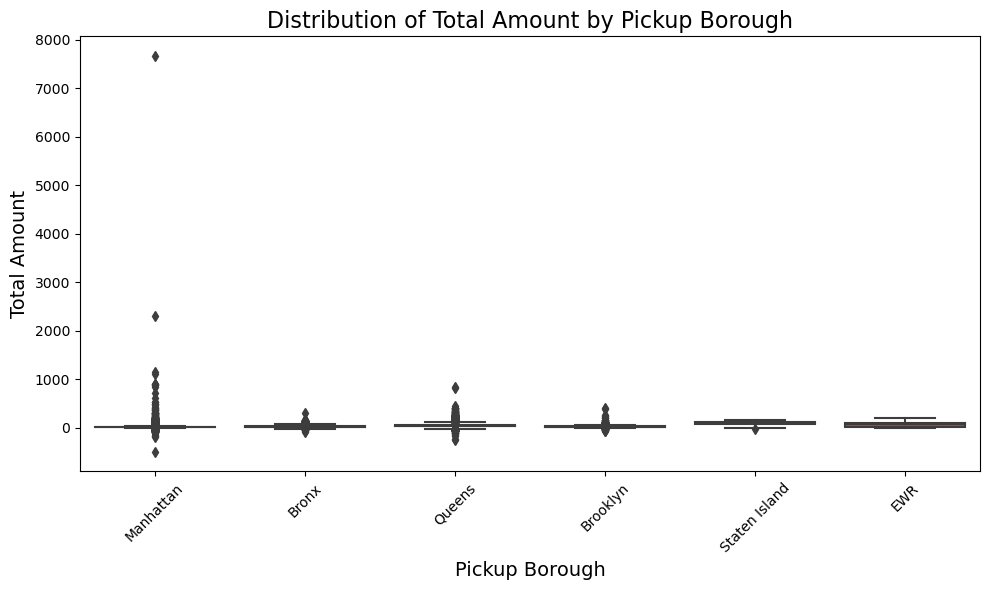

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10, 6))


sns.boxplot(x='pickup_borough', y='total_amount', data=df_dropped)


plt.title('Distribution of Total Amount by Pickup Borough', fontsize=16)
plt.xlabel('Pickup Borough', fontsize=14)
plt.ylabel('Total Amount', fontsize=14)


plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [85]:


manhattan_data = df_dropped[df_dropped['pickup_borough'] == 'Manhattan']
Q1 = manhattan_data['total_amount'].quantile(0.25)
Q3 = manhattan_data['total_amount'].quantile(0.75)
IQR = Q3 -Q1

lower_limit = Q1 + 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR



In [ ]:
(manhattan_data<lower_limit)|(df_dropped.manhattan_data>upper_limit)

In [93]:
outliers = manhattan_data[(manhattan_data['total_amount'] < lower_limit) | (manhattan_data['total_amount'] > upper_limit)]


In [92]:

df_dropped[df_dropped['pickup_borough'] == 'Manhattan']['total_amount'].describe()


count    1.197958e+06
mean     1.495768e+01
std      1.127767e+01
min     -4.928000e+02
25%      1.056000e+01
50%      1.300000e+01
75%      1.716000e+01
max      7.661280e+03
Name: total_amount, dtype: float64

In [94]:

Bronx_data = df_dropped[df_dropped['pickup_borough'] == 'Bronx']
Queens = df_dropped[df_dropped['pickup_borough'] == 'Queens']
Brooklyn = df_dropped[df_dropped['pickup_borough'] == 'Brooklyn']
Staten_island = df_dropped[df_dropped['pickup_borough'] == 'Staten_island']
EWR = df_dropped[df_dropped['pickup_borough'] == 'EWR']


In [96]:

def remove_outliers(df_dropped, borough_col, amount_col, borough_name):

    borough_data = df_dropped[df_dropped[borough_col] == borough_name]
    
 
    Q1 = borough_data[amount_col].quantile(0.25)
    Q3 = borough_data[amount_col].quantile(0.75)
    IQR = Q3 - Q1
    

    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    

    filtered_df = df_dropped[
        (df_dropped[borough_col] != borough_name) | 
        ((df_dropped[amount_col] >= lower_limit) & (df_dropped[amount_col] <= upper_limit))
    ]
    
    return filtered_df

In [99]:
df_dropped = df



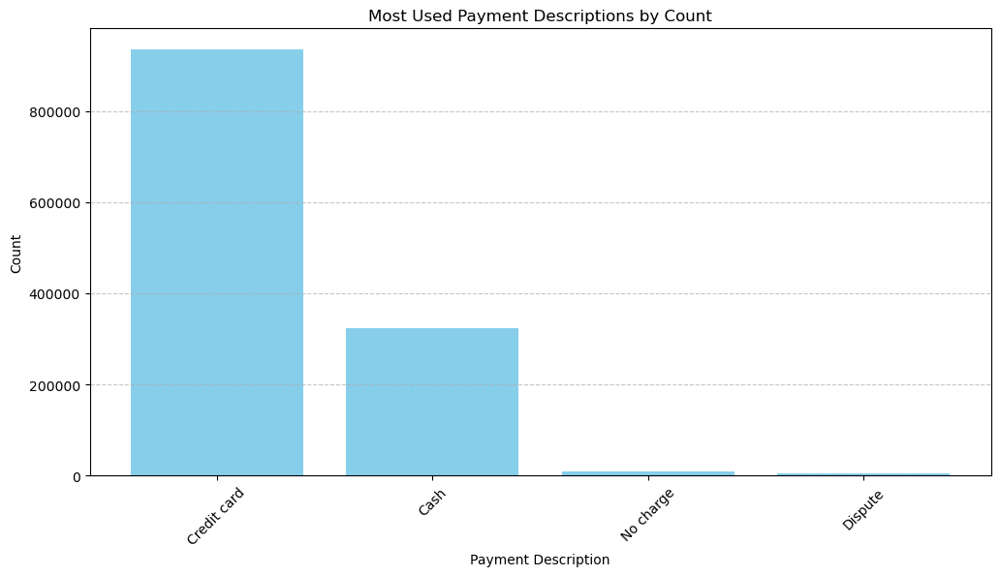

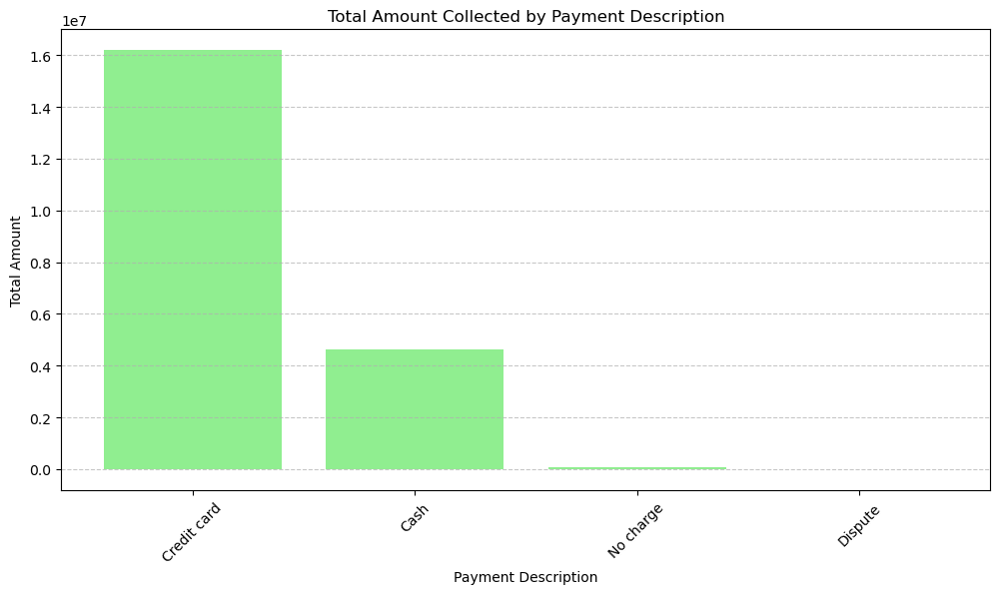

In [109]:
payment_summary = df.groupby(['payment_type', 'payment_description']).agg(
    count=('total_amount', 'count'),
    total_amount_sum=('total_amount', 'sum')
).reset_index().sort_values(by='count', ascending=False)

# Plot by count
plt.figure(figsize=(12, 6))
plt.bar(payment_summary['payment_description'], payment_summary['count'], color='skyblue')
plt.title('Most Used Payment Descriptions by Count')
plt.xlabel('Payment Description')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Plot by total amount
plt.figure(figsize=(12, 6))
plt.bar(payment_summary['payment_description'], payment_summary['total_amount_sum'], color='lightgreen')
plt.title('Total Amount Collected by Payment Description')
plt.xlabel('Payment Description')
plt.ylabel('Total Amount')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

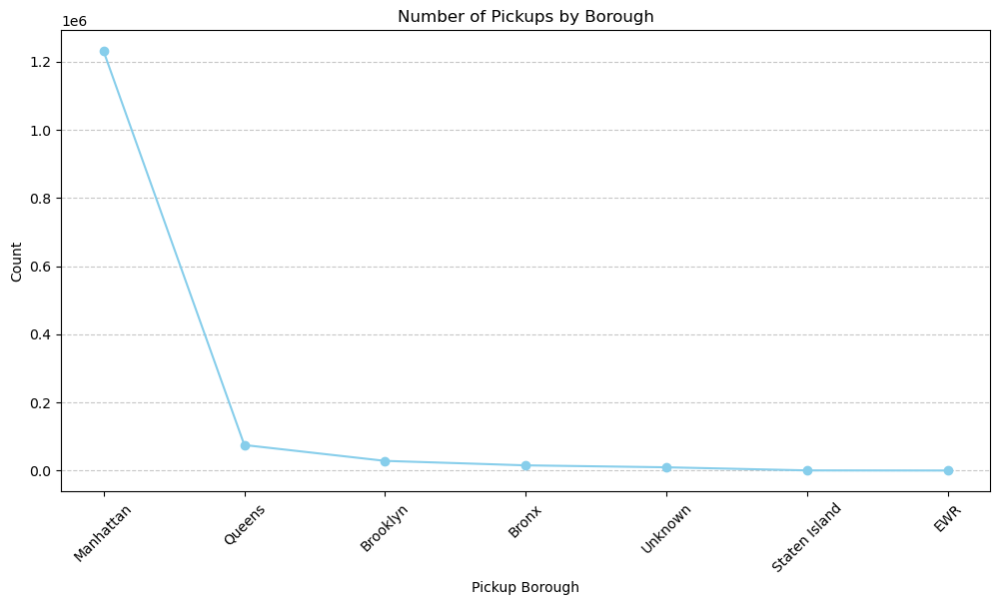

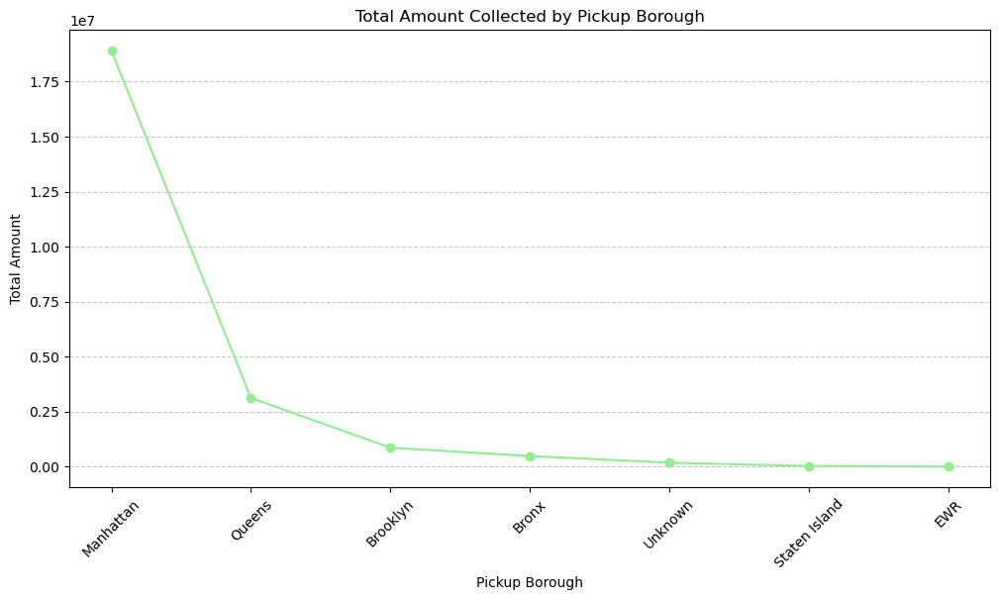

In [110]:

pickup_summary = df.groupby(['pickup_borough']).agg(
    count=('total_amount', 'count'),
    total_amount_sum=('total_amount', 'sum')
).reset_index().sort_values(by='total_amount_sum', ascending=False)

# Plot by count using a line chart
plt.figure(figsize=(12, 6))
plt.plot(pickup_summary['pickup_borough'], pickup_summary['count'], marker='o', linestyle='-', color='skyblue')
plt.title('Number of Pickups by Borough')
plt.xlabel('Pickup Borough')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


plt.figure(figsize=(12, 6))
plt.plot(pickup_summary['pickup_borough'], pickup_summary['total_amount_sum'], marker='o', linestyle='-', color='lightgreen')
plt.title('Total Amount Collected by Pickup Borough')
plt.xlabel('Pickup Borough')
plt.ylabel('Total Amount')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


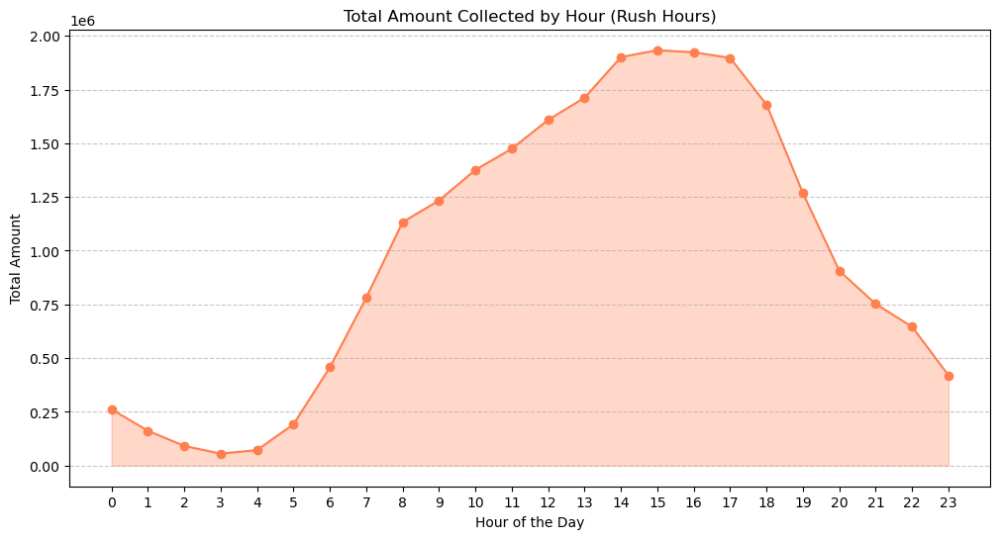

In [116]:

df['tpep_pickup_datetime'] = pd.to_datetime(df['tpep_pickup_datetime'])


df['pickup_hour'] = df['tpep_pickup_datetime'].dt.hour


hourly_summary = df.groupby('pickup_hour').agg(
    total_amount_sum=('total_amount', 'sum')
).reset_index()

plt.figure(figsize=(12, 6))
plt.plot(hourly_summary['pickup_hour'], hourly_summary['total_amount_sum'], color='coral', marker='o', linestyle='-')
plt.fill_between(hourly_summary['pickup_hour'], hourly_summary['total_amount_sum'], color='coral', alpha=0.3)
plt.title('Total Amount Collected by Hour (Rush Hours)')
plt.xlabel('Hour of the Day')
plt.ylabel('Total Amount')
plt.xticks(range(0, 24))  
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



In [115]:
df.columns

Index(['index', 'VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag',
       'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra',
       'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'total_amount', 'congestion_surcharge', 'payment_description',
       'rate_description', 'store_and_fwd_description', 'pickup_zone',
       'pickup_borough', 'dropoff_zone', 'dropoff_borough'],
      dtype='object')

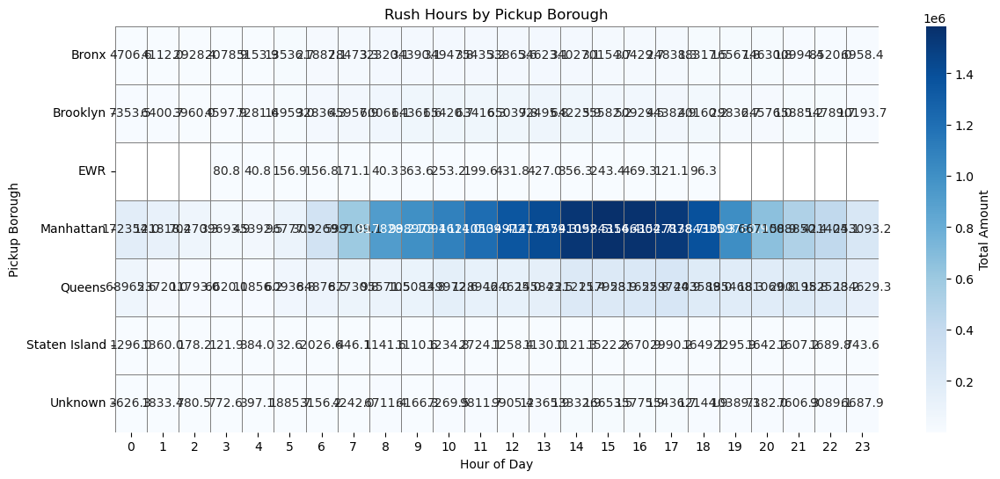

In [123]:

import seaborn as sns



heatmap_data = borough_hourly.pivot_table(
    values='total_amount_sum',
    index='pickup_borough',
    columns='pickup_hour',
    aggfunc='sum'
)

# Create the heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data, annot=True, fmt='.1f', cmap='Blues', cbar_kws={'label': 'Total Amount'},
            linewidths=0.5, linecolor='gray')

plt.title('Rush Hours by Pickup Borough')
plt.xlabel('Hour of Day')
plt.ylabel('Pickup Borough')
plt.show()



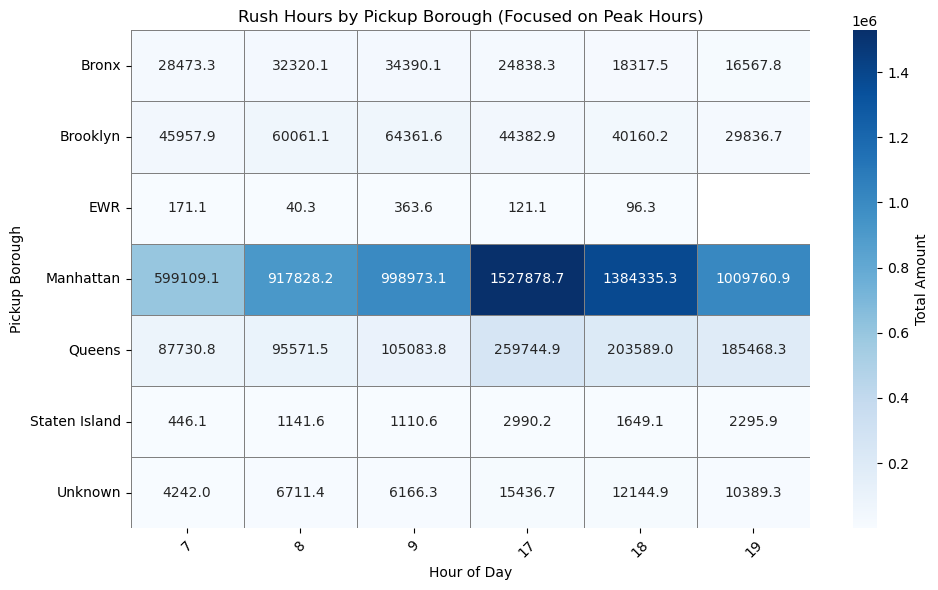

In [124]:



peak_hours = [7, 8, 9, 17, 18, 19]
filtered_data = borough_hourly[borough_hourly['pickup_hour'].isin(peak_hours)]


heatmap_data = filtered_data.pivot_table(
    values='total_amount_sum',
    index='pickup_borough',
    columns='pickup_hour',
    aggfunc='sum'
)

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt='.1f', cmap='Blues', cbar_kws={'label': 'Total Amount'},
            linewidths=0.5, linecolor='gray')

plt.title('Rush Hours by Pickup Borough (Focused on Peak Hours)')
plt.xlabel('Hour of Day')
plt.ylabel('Pickup Borough')
plt.xticks(rotation=45)
plt.tight_layout()  
plt.show()
